In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import loompy
import matplotlib.pyplot as plt
import scipy.stats as st
import warnings
warnings.filterwarnings('ignore')

/work/rwth1209/enviroments/spage/lib/python3.9/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/work/rwth1209/enviroments/spage/lib/python3.9/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def dna_to_twobit(dna: str) -> int:
/work/rwth1209/env

In [2]:
import sys
sys.path.insert(0,"/work/rwth1209/projects/integration_merfish_snrna/spage/SpaGE")

In [3]:
from SpaGE.main import SpaGE

In [4]:
scref = sc.read_h5ad('/work/rwth1209/dana_projects/test_new_imputation_tools/enVI/data_preprocessing/scref_3000hvg.h5ad')
sp = sc.read_h5ad('/work/rwth1209/dana_projects/test_new_imputation_tools/enVI/data_preprocessing/withhelded_high_counts_array_raw_483_genes.h5ad')

In [5]:
scref

AnnData object with n_obs × n_vars = 257029 × 3180
    obs: 'sangerID', 'donor', 'donor_type', 'region', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'cell_type', 'cell_state', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score'
    var: 'gene_id', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'age_colors', 'cell_or_nuclei_colors', 'cell_state_colors', 'cell_type_colors', 'donor_colors', 'donor_type_colors', 'facility_colors', 'flushed_colors', 'gender_colors', 'hvg', 'kit_10x_colors', 'leiden', 'log1p', 'modality_colors', 'neighbors', 'original_or_new_colors', 'region_colors', 'region_finest_colors', 'scANVI_predictions_colors', 'umap'
    obsm: 'X_umap'
    layers: 'counts_norm'
    obsp: 'connectivities', 'distances'

In [6]:
sp

AnnData object with n_obs × n_vars = 180489 × 483
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_s

In [7]:
spatial = sp
ref = scref

In [8]:
spatial.X = spatial.layers["counts"].copy()
sc.pp.filter_cells(spatial, min_counts=5)
sc.pp.filter_genes(spatial, min_cells=5)
sc.pp.filter_cells(ref, min_counts=5)
sc.pp.filter_genes(ref, min_cells=5)
sc.pp.normalize_total(spatial, target_sum=1e4)
sc.pp.log1p(spatial)

In [9]:
# genes_to_imp = ['CCL21', 'MMRN1', 'PRF1', 'TBX1', 'PRF1',
#                 'NEXN', 'CACNA1D', 'PPP2R2B', 'BASP1', 'TM4SF1',
#                 'RNF19A', 'IMMP2L', 'NFKB1', 'CCDC141', 'SMC4']

In [10]:
spatial_genes = list(sp.var_names)
len(spatial_genes)
genes_to_keep = [gene for gene in ref.var_names if gene not in spatial_genes]


In [11]:
len(genes_to_keep)

2535

In [12]:
scref_filtered = ref[:, genes_to_keep]

In [13]:
ref

AnnData object with n_obs × n_vars = 257029 × 3017
    obs: 'sangerID', 'donor', 'donor_type', 'region', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'cell_type', 'cell_state', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'n_counts'
    var: 'gene_id', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells'
    uns: 'age_colors', 'cell_or_nuclei_colors', 'cell_state_colors', 'cell_type_colors', 'donor_colors', 'donor_type_colors', 'facility_colors', 'flushed_colors', 'gender_colors', 'hvg', 'kit_10x_colors', 'leiden', 'log1p', 'modality_colors', 'neighbors', 'original_or_new_colors', 'region_colors', 'region_finest_colors', 'scANVI_predictions_colors', 'umap'
    obsm: 'X_umap'
    layers: 'counts_norm'
    obsp: 'connectivities', 'distances'

In [14]:
scref_filtered

View of AnnData object with n_obs × n_vars = 257029 × 2535
    obs: 'sangerID', 'donor', 'donor_type', 'region', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'cell_type', 'cell_state', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'n_counts'
    var: 'gene_id', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells'
    uns: 'age_colors', 'cell_or_nuclei_colors', 'cell_state_colors', 'cell_type_colors', 'donor_colors', 'donor_type_colors', 'facility_colors', 'flushed_colors', 'gender_colors', 'hvg', 'kit_10x_colors', 'leiden', 'log1p', 'modality_colors', 'neighbors', 'original_or_new_colors', 'region_colors', 'region_finest_colors', 'scANVI_predictions_colors', 'umap'
    obsm: 'X_umap'
    layers: 'counts_norm'
    obsp: 'connectivities', 'distances'

In [15]:
genes_to_imp = list(scref_filtered.var_names)

In [16]:
len(genes_to_imp)

2535

In [17]:
ref = ref.to_df()
spatial = spatial.to_df()

In [18]:
Imp_New_Genes = SpaGE(spatial,ref,n_pv=30, genes_to_predict = genes_to_imp)

In [19]:
Imp_New_Genes.to_csv("result_allref_hc.csv")

# Check results (csv -> h5ad)

In [20]:
import scanpy as sc
import scipy
import anndata as ad
import pandas as pd

In [21]:
tmp = pd.read_csv("/work/rwth1209/dana_projects/test_new_imputation_tools/SpaGE/more_counts_<3/result_allref_hc.csv", index_col=0)
tmp = sc.AnnData(tmp)

In [22]:
original = sc.read_h5ad("/work/rwth1209/dana_projects/test_new_imputation_tools/enVI/data_preprocessing/withhelded_high_counts_array_raw_483_genes.h5ad")
tmp.X = scipy.sparse.csr_matrix(tmp.X)

In [23]:
original.X = original.layers["counts"].copy()
sc.pp.filter_cells(original, min_counts=5)
sc.pp.filter_genes(original, min_cells=5)
sc.pp.normalize_total(original, target_sum=1e4)
sc.pp.log1p(original)

In [24]:
tmp.obs = original.obs.copy()

In [25]:
tmp

AnnData object with n_obs × n_vars = 180329 × 2535
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_

In [26]:
original

AnnData object with n_obs × n_vars = 180329 × 483
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_s

In [29]:
del original.varm
del original.layers

In [30]:
assert original.obs_names.equals(tmp.obs_names)

original
integrated = ad.concat([original, tmp], label="batch",axis=1,join="outer",merge="first")
integrated

AnnData object with n_obs × n_vars = 180329 × 3018
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_

In [31]:
#integrated.write_h5ad("spage_3000_genes_hc.h5ad")

In [48]:
spage = sc.read_h5ad('/work/rwth1209/dana_projects/test_new_imputation_tools/SpaGE/more_counts_<3/spage_3000_genes_hc.h5ad')
original = sc.read_h5ad('/hpcwork/rwth1209/data/merfish/test_imputation/heart_high_counts.h5ad')
scd = scref

In [49]:
spage

AnnData object with n_obs × n_vars = 180329 × 3018
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_

In [50]:
original.X = original.layers["counts"].copy()
original = original[spage.obs_names, :]
sc.pp.filter_cells(original, min_counts=5)
sc.pp.filter_genes(original, min_cells=5)
sc.pp.normalize_total(original, target_sum=1e4)
sc.pp.log1p(original)
original

AnnData object with n_obs × n_vars = 180329 × 500
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_s

In [59]:
spage = spage[spage.obs_names, :]
sc.pp.filter_cells(spage, min_counts=5)
sc.pp.filter_genes(spage, min_cells=5)
sc.pp.normalize_total(spage, target_sum=1e4)
sc.pp.log1p(spage)
spage

AnnData object with n_obs × n_vars = 180329 × 3017
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_

In [51]:
original

AnnData object with n_obs × n_vars = 180329 × 500
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_s

In [52]:
original.obsm["spatial"]

array([[3565.87419104,  410.11254305],
       [3539.76881723,  414.17208217],
       [3601.93767505,  410.7728172 ],
       ...,
       [2095.82020552, 6599.48130318],
       [2179.77640308, 6600.13903434],
       [2180.16653708, 6549.82507899]])

In [60]:
spage.uns['spatial'] = original.obsm["spatial"]

In [54]:
original.X.max()

9.142394

In [61]:
spage.X.max()

9.063878155664089

In [56]:
scd.X.max()

17441.0

In [57]:
genes_to_check = ['CCL21', 'MMRN1', 'PRF1', 'TBX1', 'PRF1',
                'NEXN', 'CACNA1D', 'PPP2R2B', 'BASP1', 'TM4SF1',
                'RNF19A', 'IMMP2L', 'NFKB1', 'CCDC141', 'SMC4']

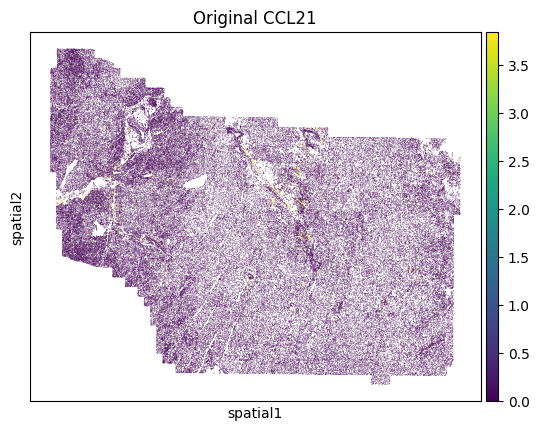

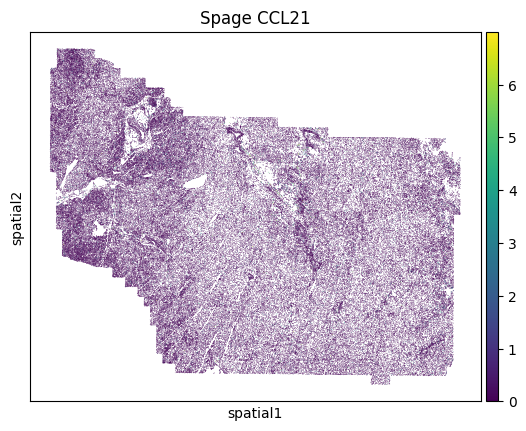

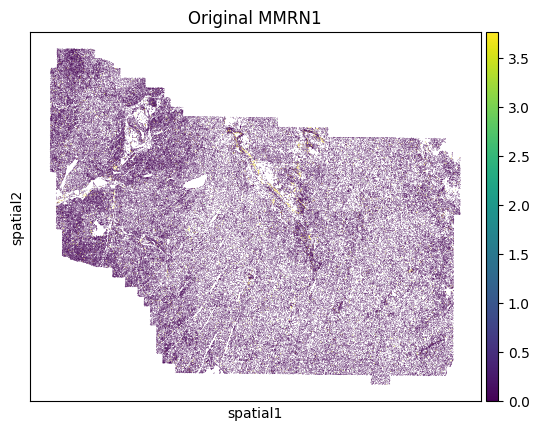

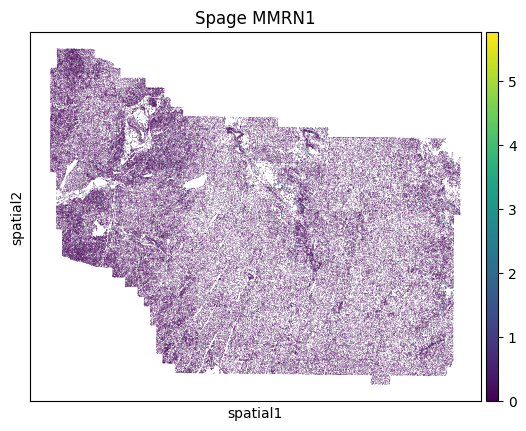

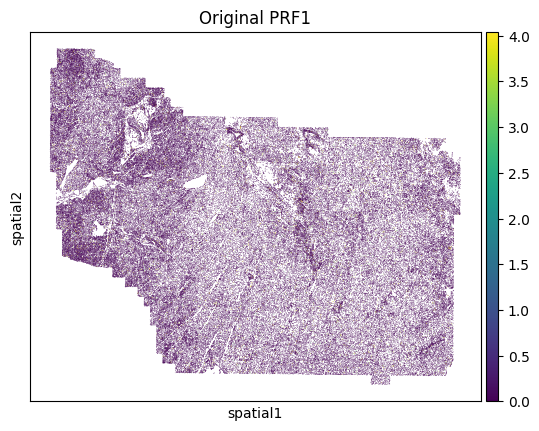

...

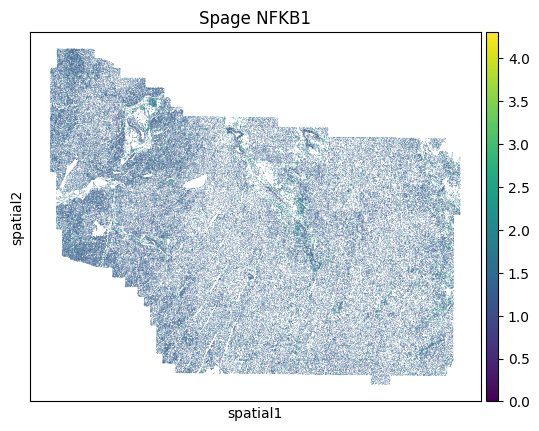

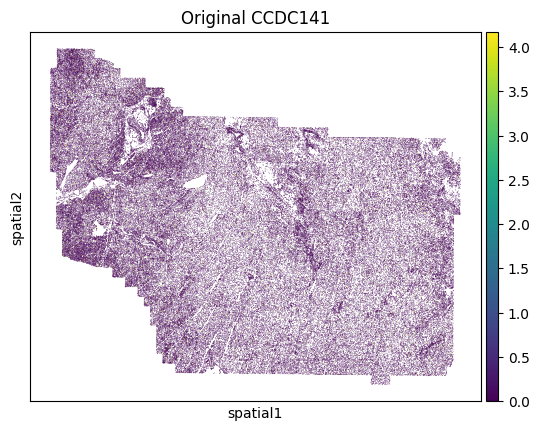

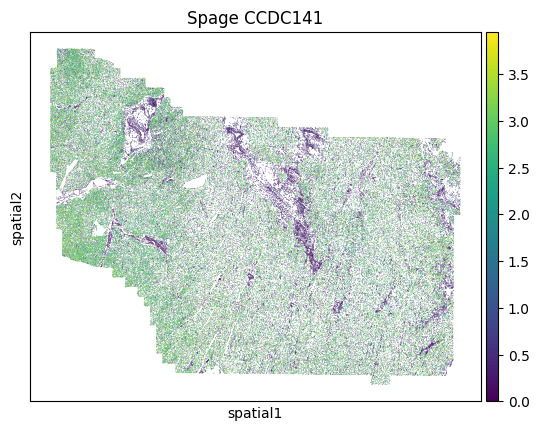

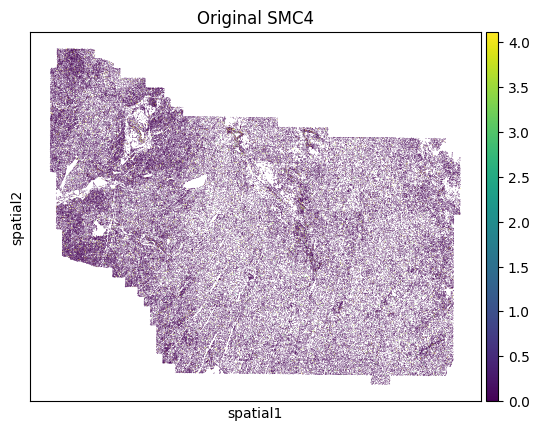

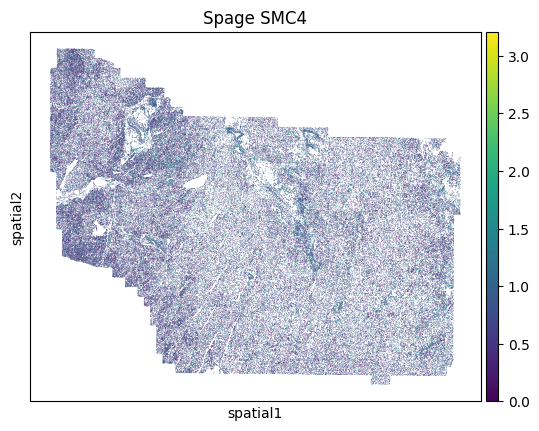

In [62]:
for gene in genes_to_check:
    sc.pl.embedding(original, basis="spatial", color=gene, title=f"Original {gene}",vmax="p99")
    sc.pl.embedding(spage, basis="spatial", color=gene, title=f"Spage {gene}")

In [63]:
#spage.write_h5ad("spage_3000_genes_norm_hc.h5ad")

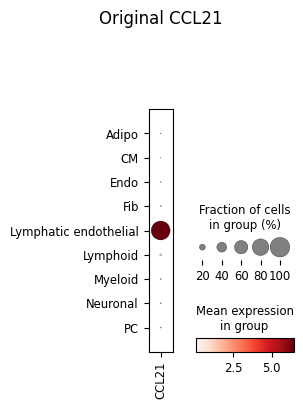

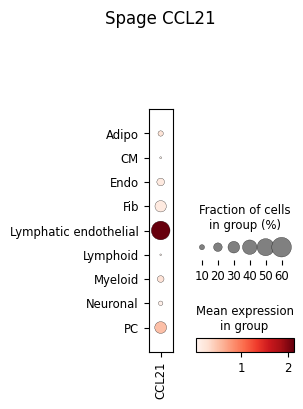

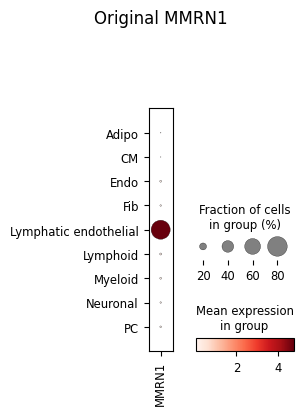

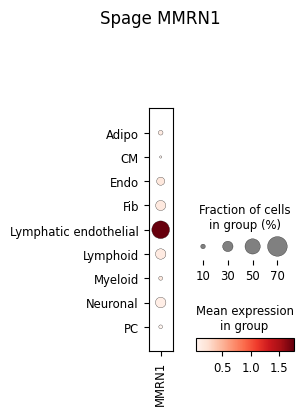

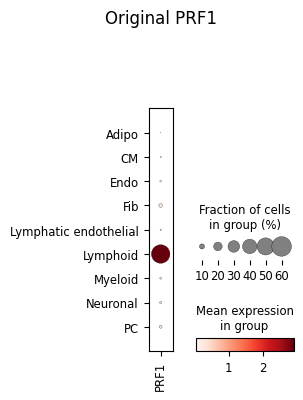

...

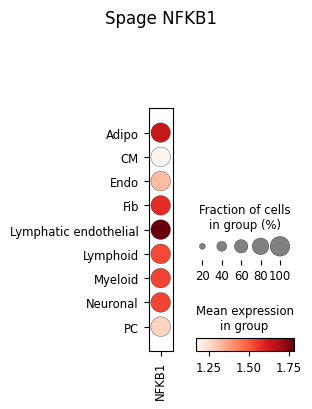

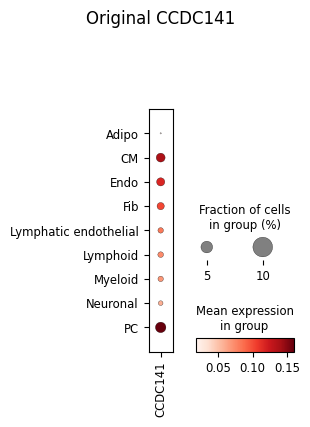

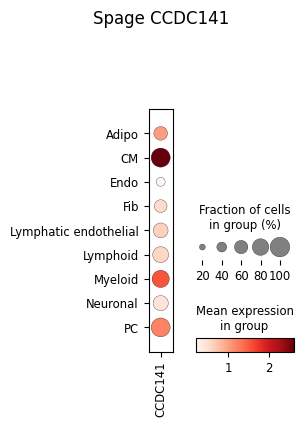

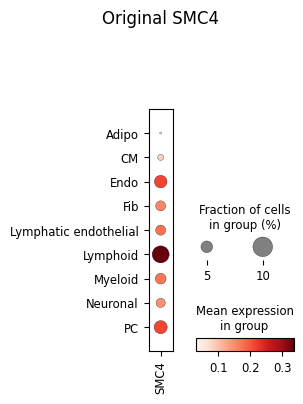

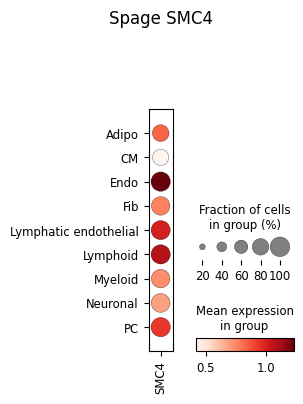

In [64]:
for gene in genes_to_check:
    sc.pl.dotplot(original, gene, groupby="cell_type",title=f"Original {gene}")
    sc.pl.dotplot(spage, gene, groupby="cell_type",title=f"Spage {gene}")

# Calculate Spearman correlation from two matrices

In [65]:
from scipy.stats import spearmanr
from sklearn.metrics import mean_squared_error

def spearman_correlation(a, b):
    a = a.toarray().flatten()
    b = b.toarray().flatten()
    print(a.shape, b.shape)
    print(mean_squared_error(a, b))
    return spearmanr(a, b)

In [66]:
for gene in genes_to_check:
    print(gene)
    print(spearman_correlation(original[:,gene].X, spage[:,gene].X))

CCL21
(180329,) (180329,)
0.6083292891800576
SignificanceResult(statistic=0.07272665056367429, pvalue=5.6434159575492194e-210)
MMRN1
(180329,) (180329,)
0.43827096785919045
SignificanceResult(statistic=0.0912276863342222, pvalue=0.0)
PRF1
(180329,) (180329,)
0.4926389403137903
SignificanceResult(statistic=0.09222478541461693, pvalue=0.0)
TBX1
(180329,) (180329,)
0.1875333761699016
SignificanceResult(statistic=0.054883796368392614, pvalue=2.5362625881425637e-120)
PRF1
(180329,) (180329,)
0.4926389403137903
SignificanceResult(statistic=0.09222478541461693, pvalue=0.0)
NEXN
(180329,) (180329,)
7.533229932156246
SignificanceResult(statistic=0.34493065557446373, pvalue=0.0)
CACNA1D
(180329,) (180329,)
0.4181740726600354
SignificanceResult(statistic=-0.011940473675012712, pvalue=3.963819892637493e-07)
PPP2R2B
(180329,) (180329,)
0.5646300182322582
SignificanceResult(statistic=0.06954914603499625, pvalue=3.659254601722248e-192)
BASP1
(180329,) (180329,)
0.5020285180759851
SignificanceResult(s

# UMAP

In [67]:
sp.var

,n_cells
CX3CL1,16539
PPP1R15A,42438
GZMB,2912
NFKBIA,62274
RELB,3651
...,...
RBMS3-AS3,2488
NRXN1,4462
FRMD5,7283
HCN1,3032


In [68]:
spage.var

,n_cells,batch
CX3CL1,16539,0
PPP1R15A,42438,0
GZMB,2912,0
NFKBIA,62274,0
RELB,3651,0
...,...,...
MT-CO1,179460,1
MT-CO2,160343,1
MT-ATP6,148171,1
MT-ND4,138872,1


In [69]:
spatial_genes = list(sp.var_names)
len(spatial_genes)
genes_to_keep = [gene for gene in spage.var_names if gene not in spatial_genes]
spage_filtered = spage[:, genes_to_keep]

In [70]:
len(spatial_genes)

483

In [71]:
len(spage_filtered)

180329

In [72]:
spage.X.max()

9.063878155664089

In [73]:
sc.pp.neighbors(spage)

         Falling back to preprocessing with `sc.pp.pca` and default params.


In [74]:
sc.tl.umap(spage)

In [75]:
sc.tl.leiden(spage)

In [76]:
sc.tl.leiden(spage, key_added="leiden_res0_25", resolution=0.25)

In [77]:
#spage.write_h5ad("spage_3000_genes_norm.h5ad")

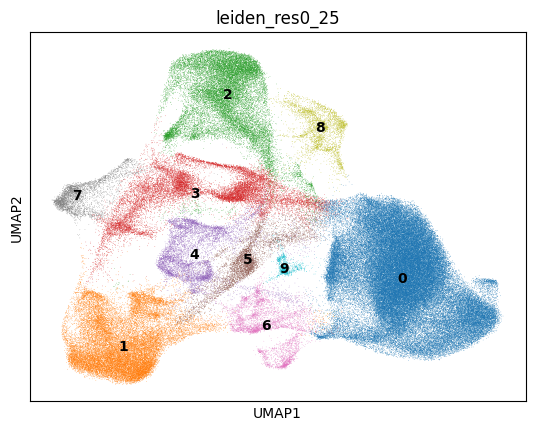

In [78]:
sc.pl.umap(
    spage,
    color=["leiden_res0_25"],
    legend_loc="on data")

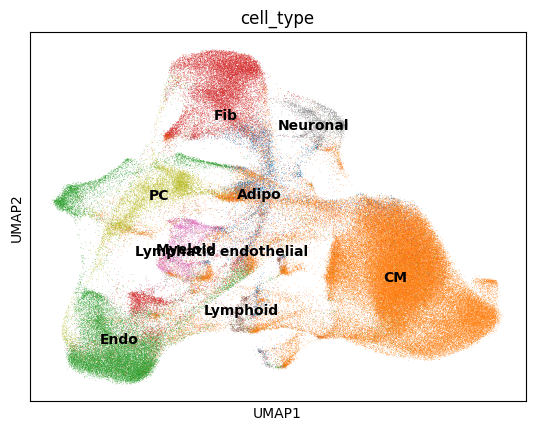

In [79]:
sc.pl.umap(
    spage,
    color=["cell_type"],
    legend_loc="on data")

In [81]:
sc.tl.umap(original)

In [83]:
original

AnnData object with n_obs × n_vars = 180329 × 500
    obs: 'fov', 'volume', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'CX43_raw', 'CX43_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'DES_raw', 'DES_high_pass', 'VIM_raw', 'VIM_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'NCAM1_raw', 'NCAM1_high_pass', 'MPO_raw', 'MPO_high_pass', 'COL1A_raw', 'COL1A_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'region', 'COLIII_raw', 'COLIII_high_pass', 'Beta-3-Tubulin_raw', 'Beta-3-Tubulin_high_pass', 'COL3_raw', 'COL3_high_pass', 'dataset', 'n_counts', 'n_genes', 'tacco', 'tacco_score', '_scvi_batch', '_scvi_labels', 'leiden_R', 'fibro_score', 'myofibro_score', 'Fibroblast_Type', 'Fibroblast_Leiden', 'Preliminary CT', 'Preliminary_CT', 'peri_score', 'leiden_0.2', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'cell_type', 'cleanup_0', 'cardio_score', 'adipo_s

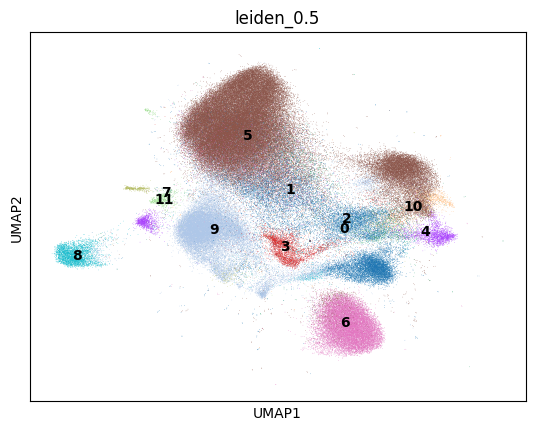

In [89]:
sc.pl.umap(
    original,
    color=["leiden_0.5"],
    legend_loc="on data")

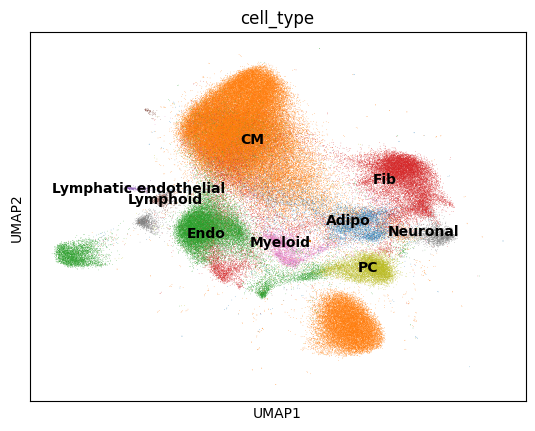

In [88]:
sc.pl.umap(
    original,
    color=["cell_type"],
    legend_loc="on data")